<a href="https://colab.research.google.com/github/omerfarukballi/master_thesis/blob/main/master_thesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Library Import

In [1]:
## Data Visualisation Libraries
import matplotlib.pyplot as plt
import plotly.express as px
import folium
from folium import plugins
from folium.plugins import HeatMap
import seaborn as sns
## Data Analysis Libraries
import pandas as pd
import networkx as nx
import numpy as np
## Machine Learning & Statistics Libraries
from sklearn.preprocessing import StandardScaler
import statistics
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

Data Reading

In [2]:
data=pd.read_csv('rideshare_kaggle.csv')

In [3]:
data

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693066,616d3611-1820-450a-9845-a9ff304a4842,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693067,633a3fc3-1f86-4b9e-9d48-2b7132112341,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693068,64d451d0-639f-47a4-9b7c-6fd92fbd264f,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800
693069,727e5f07-a96b-4ad1-a2c7-9abc3ad55b4e,1.543708e+09,23,1,12,2018-12-01 23:53:05,America/New_York,West End,North End,Uber,...,0.0000,1543683600,31.42,1543658400,44.76,1543690800,27.77,1543658400,44.09,1543690800


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Descriptive Statistics

In [5]:
data.describe().T.style.background_gradient().to_excel("descriptive_statistics.xlsx")

In [6]:
data.corr().T.style.background_gradient().to_excel("correlation_statistics.xlsx")

In [7]:
correlation=data.corr()[['price']]

In [8]:
more=correlation[(correlation['price']>0.001)|(correlation['price']<-0.001)]

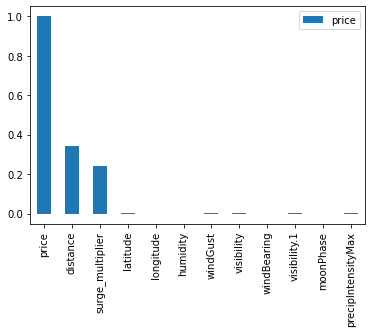

In [9]:
more.plot.bar()

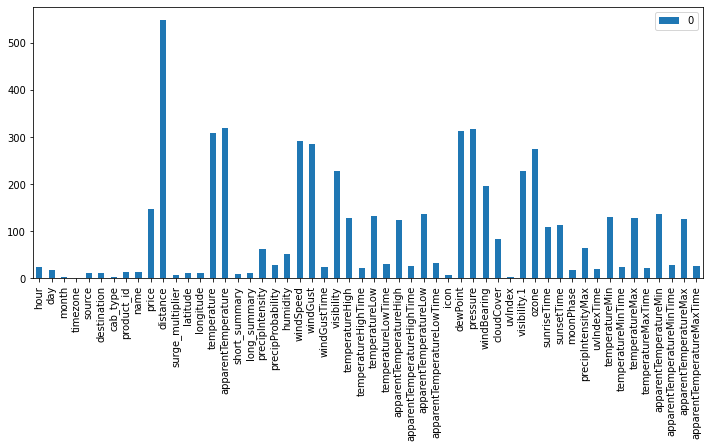

In [10]:
pd.DataFrame(data.drop(columns=['id','timestamp','datetime']).nunique()).plot.bar(figsize=(12,5),label=True)

In [11]:
basic_summary=data[['source','destination','id']]

In [12]:
columnx=list(basic_summary.groupby(['source','destination']).count().reset_index().pivot(values='id',columns='destination',index='source').reset_index().columns)

In [13]:
fig = px.bar(basic_summary.groupby(['source','destination']).count().reset_index().pivot(values='id',columns='destination',index='source').reset_index(), y=columnx, x="source", barmode='stack',title="Wide-Form Input")
fig.show(figsize=(12,5))

In [14]:
columnx.remove('source')

In [15]:
data.corr().T.style.background_gradient()

,timestamp,hour,day,month,price,distance,surge_multiplier,latitude,longitude,temperature,apparentTemperature,precipIntensity,precipProbability,humidity,windSpeed,windGust,windGustTime,visibility,temperatureHigh,temperatureHighTime,temperatureLow,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,dewPoint,pressure,windBearing,cloudCover,uvIndex,visibility.1,ozone,sunriseTime,sunsetTime,moonPhase,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
timestamp,1.000000,-0.028004,-0.341292,0.771182,0.000808,0.003553,0.000572,0.168130,-0.136802,-0.248748,-0.226264,-0.179958,-0.147596,-0.168024,-0.066171,0.005706,0.998842,0.158993,-0.228125,0.999332,-0.366859,0.999175,-0.215363,0.999313,-0.401999,0.999203,-0.265444,0.533025,-0.133526,-0.081699,-0.025708,0.158993,0.196518,0.999372,0.999372,-0.846203,-0.211700,0.999364,-0.306971,0.998194,-0.186328,0.999290,-0.378346,0.998286,-0.157748,0.999276
hour,-0.028004,1.000000,0.066090,-0.079379,0.000561,0.002280,-0.000077,0.019493,-0.006295,0.218769,0.198190,-0.233349,-0.129725,-0.275762,0.072778,0.077308,-0.028047,0.174129,0.005172,-0.027838,0.015326,-0.026797,0.005513,-0.027997,0.016005,-0.026970,0.004839,-0.067366,0.036089,0.026525,0.330209,0.174129,0.034164,-0.027537,-0.027535,0.020483,0.019940,-0.027518,0.015513,-0.027027,0.002958,-0.027990,0.015820,-0.027704,0.002897,-0.027785
day,-0.341292,0.066090,1.000000,-0.861306,-0.000722,-0.000627,0.001389,0.006838,0.078690,-0.084116,-0.223545,0.091664,0.030903,-0.093340,0.440502,0.402637,-0.336417,0.104992,-0.283561,-0.343118,-0.088320,-0.333558,-0.398183,-0.343291,-0.192984,-0.335504,-0.101582,-0.444635,0.092167,-0.041190,-0.011885,0.104992,0.377057,-0.341068,-0.341012,-0.007260,0.145568,-0.341198,0.038076,-0.333990,-0.304870,-0.344532,-0.019940,-0.335043,-0.444445,-0.344411
month,0.771182,-0.079379,-0.861306,1.000000,0.000913,0.002298,-0.000628,0.085791,-0.126912,-0.081774,0.024983,-0.154531,-0.098031,-0.022256,-0.334803,-0.270494,0.767265,0.011493,0.068313,0.772053,-0.138732,0.765489,0.152651,0.772163,-0.086998,0.766822,-0.074794,0.589609,-0.135103,-0.016800,-0.012321,0.011493,-0.149333,0.770684,0.770646,-0.452469,-0.213054,0.770767,-0.191803,0.765255,0.105326,0.772989,-0.191153,0.766031,0.215076,0.772896
price,0.000808,0.000561,-0.000722,0.000913,1.000000,0.345061,0.240458,0.002088,-0.001417,-0.000084,-0.000193,0.000166,-0.000243,-0.001238,0.000990,0.001218,0.000851,0.001497,-0.000516,0.000759,0.000182,0.000754,-0.000261,0.000741,0.000831,0.000761,-0.000615,0.000866,-0.001382,0.000883,-0.000424,0.001497,0.000460,0.000760,0.000760,-0.001602,0.001114,0.000763,-0.000428,0.000769,-0.000550,0.000766,-0.000580,0.000814,-0.000290,0.000746
distance,0.003553,0.002280,-0.000627,0.002298,0.345061,1.000000,0.024769,0.000819,-0.000293,-0.002884,-0.003116,-0.000256,0.000371,-0.003901,0.002277,0.001364,0.003618,0.004092,-0.004154,0.003604,-0.002146,0.003556,-0.004098,0.003585,-0.001501,0.003583,-0.004078,0.003490,-0.002146,-0.000905,0.002318,0.004092,0.001467,0.003556,0.003556,-0.004594,0.000648,0.003562,-0.003396,0.003428,-0.004191,0.003580,-0.003937,0.003526,-0.004238,0.003584
surge_multiplier,0.000572,-0.000077,0.001389,-0.000628,0.240458,0.024769,1.000000,0.001375,-0.001829,-0.001572,-0.002532,-0.001530,-0.002769,-0.001676,0.002511,0.002093,0.000439,0.001714,-0.001897,0.000520,-0.002601,0.000573,-0.002041,0.000520,-0.002994,0.000551,-0.001849,-0.003003,0.002167,-0.002103,-0.002422,0.001714,0.003324,0.000544,0.000544,-0.000150,-0.000101,0.000544,-0.000724,0.000554,-0.001951,0.000522,-0.001304,0.000464,-0.002154,0.000519
latitude,0.168130,0.019493,0.006838,0.085791,0.002088,0.000819,0.001375,1.000000,-0.531259,-0.098604,-0.067098,-0.074181,-0.071275,-0.117481,-0.097139,0.024309,0.172625,0.124166,-0.115307,0.173702,-0.032133,0.171193,-0.092167,0

In [16]:
data.describe().T.style.background_gradient()



,count,mean,std,min,25%,50%,75%,max
timestamp,693071.000000,1544045709.755097,689192.492586,1543203646.000000,1543443968.000000,1543737478.000000,1544827509.000000,1545160511.000000
hour,693071.000000,11.619137,6.948114,0.000000,6.000000,12.000000,18.000000,23.000000
day,693071.000000,17.794365,9.982286,1.000000,13.000000,17.000000,28.000000,30.000000
month,693071.000000,11.586684,0.492429,11.000000,11.000000,12.000000,12.000000,12.000000
price,637976.000000,16.545125,9.324359,2.500000,9.000000,13.500000,22.500000,97.500000
distance,693071.000000,2.189430,1.138937,0.020000,1.280000,2.160000,2.920000,7.860000
surge_multiplier,693071.000000,1.013870,0.091641,1.000000,1.000000,1.000000,1.000000,3.000000
latitude,693071.000000,42.338172,0.047840,42.214800,42.350300,42.351900,42.364700,42.366100
longitude,693071.000000,-71.066151,0.020302,-71.105400,-71.081000,-71.063100,-71.054200,-71.033000
temperature,693071.000000,39.584388,6.726084,18.910000,36.450000,40.490000,43.580000,57.220000


In [17]:
def plot_bar(groupby_column):
    x1 =data.groupby(groupby_column).size().reset_index(name="counts")
    fig1 = px.bar(data_frame=x1, x=groupby_column, y="counts", barmode="stack")
    print(x1)
    fig1.show(renderer='png')

In [18]:
!pip install -U kaleido

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [19]:
import kaleido

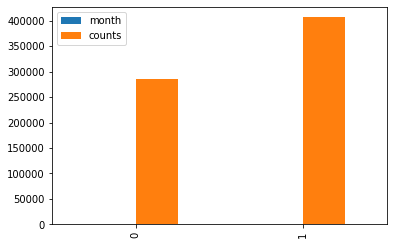

In [20]:
data.groupby('month').size().reset_index(name="counts").plot.bar()

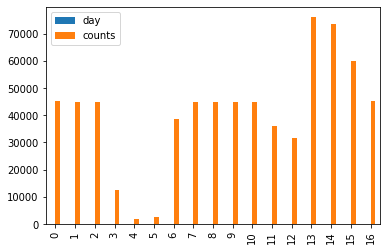

In [21]:
data.groupby('day').size().reset_index(name="counts").plot.bar()

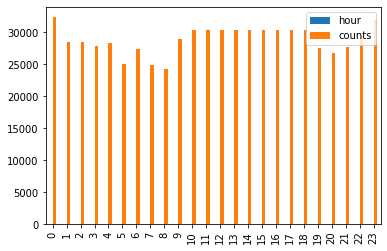

In [22]:
data.groupby('hour').size().reset_index(name="counts").plot.bar()

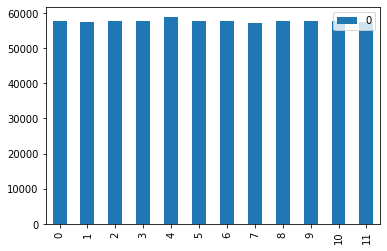

In [23]:
data.groupby('source').size().reset_index().plot.bar()

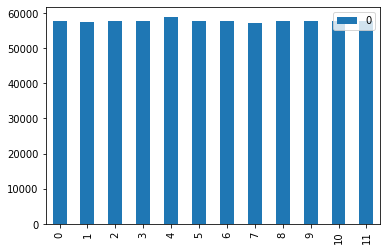

In [24]:
data.groupby('destination').size().reset_index().plot.bar()

In [25]:
longs = data.longitude.to_list()
lats = data.latitude.to_list()
meanLong = statistics.mean(longs)
meanLat = statistics.mean(lats)
mapObj = folium.Map(location=[meanLat, meanLong], tiles="openstreetmap", zoom_start = 17.5)
data.dropna(inplace = True)
heatmap = HeatMap( list(zip(lats, longs, data["price"])),
                   min_opacity=0.5,
                   max_val=data["price"].max(),
                   radius=40, blur=35)
heatmap.add_to(mapObj)
mapObj

<ipython-input-25-45d73d4f8761>:7: UserWarning:

The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.



In [26]:
## Network Analysis with this dataset.

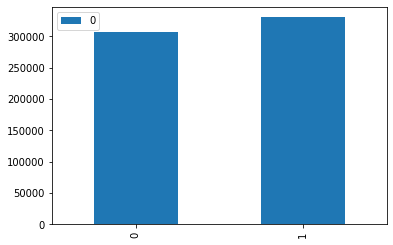

In [27]:
data.groupby('cab_type').size().reset_index().plot.bar()

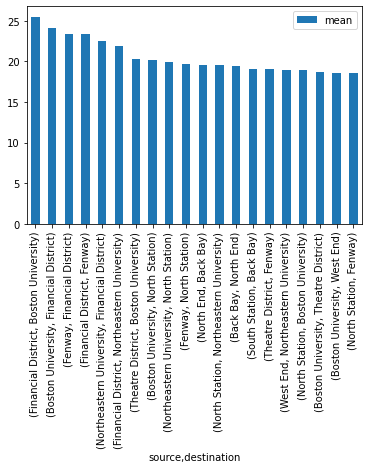

In [28]:
pd.set_option('display.max_rows', 72)
data.groupby(by=["source","destination"]).price.agg(["mean"]).sort_values("mean", ascending=False)[:20].plot.bar()

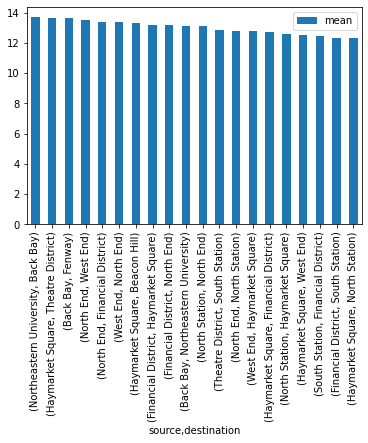

In [29]:
pd.set_option('display.max_rows', 72)
data.groupby(by=["source","destination"]).price.agg(["mean"]).sort_values("mean", ascending=False)[-20:].plot.bar()

In [30]:
data.shape

(637976, 57)

In [31]:
df =data.groupby(by=["day","cab_type"]).size().reset_index(name="counts")
px.bar(data_frame=df, x="day", y="counts", color="cab_type", barmode="group")

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



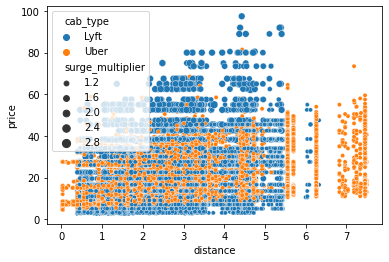

In [32]:
df = data[(data["hour"]>=22) | (data["hour"]<=4)]
sns.scatterplot(data = df, x = "distance",
                y = "price", hue = "cab_type", size = "surge_multiplier")
plt.show()

In [33]:
data_x=data[list(more.index)].drop(columns=['latitude','longitude'])

In [34]:
g=list(more.index)


In [35]:
g

['price',
 'distance',
 'surge_multiplier',
 'latitude',
 'longitude',
 'humidity',
 'windGust',
 'visibility',
 'windBearing',
 'visibility.1',
 'moonPhase',
 'precipIntensityMax']

In [36]:
scaler = StandardScaler()
data_x[[
 'distance',
 'surge_multiplier',
 'humidity',
 'windGust',
 'visibility',
 'windBearing',
 'visibility.1',
 'moonPhase',
 'precipIntensityMax']]=scaler.fit_transform(data_x.drop(columns=['price']))

In [37]:
categories=list(data.select_dtypes(include=['object','category']).columns.tolist())

In [38]:
categories.remove('id')
categories.remove('timezone')
categories.remove('datetime')

In [39]:
adds_on=pd.get_dummies(data[categories])

In [40]:
data_x[adds_on.columns]=adds_on

In [41]:
null_ratio=pd.DataFrame(data_x.isnull().sum()/data_x.count())
null_ratio[null_ratio>0].dropna()

,0


In [42]:
data_x['price'] = data_x['price'].fillna(data_x['price'].median())


In [43]:
data_x

,price,distance,surge_multiplier,humidity,windGust,visibility,windBearing,visibility.1,moonPhase,precipIntensityMax,...,long_summary_ Rain in the morning and afternoon.,long_summary_ Rain throughout the day.,"long_summary_ Rain until morning, starting again in the evening.",icon_ clear-day,icon_ clear-night,icon_ cloudy,icon_ fog,icon_ partly-cloudy-day,icon_ partly-cloudy-night,icon_ rain
0,5.0,-1.540640,-0.157905,-0.440597,0.132242,0.588364,-1.646155,0.588364,-1.140607,1.634149,...,0,1,0,0,0,0,0,0,1,0
1,11.0,-1.540640,-0.157905,1.435644,0.663565,-1.415614,-1.313115,-1.415614,0.249000,1.677615,...,0,0,1,0,0,0,0,0,0,1
2,7.0,-1.540640,-0.157905,0.064545,-0.215671,0.588364,0.200705,0.588364,0.412483,1.250201,...,0,0,0,0,1,0,0,0,0,0
3,26.0,-1.540640,-0.157905,-0.079782,-0.603292,0.588364,0.907154,0.588364,0.698578,-0.676781,...,0,0,0,0,1,0,0,0,0,0
4,9.0,-1.540640,-0.157905,-0.296271,0.126569,0.588364,0.836509,0.588364,0.575966,-0.674970,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
693065,9.5,-1.047427,-0.157905,-0.007618,-1.058982,0.505729,-0.879153,0.505729,0.984674,-0.676781,...,0,0,0,0,0,0,0,0,1,0
693066,13.0,-1.047427,-0.157905,-0.007618,-1.058982,0.505729,-0.879153,0.505729,0.984674,-0.676781,...,0,0,0,0,0,0,0,0,1,0
693067,9.5,-1.047427,-0.157905,-0.007618,-1.058982,0.505729,-0.879153,0.505729,0.984674,-0.676781,...,0,0,0,0,0,0,0,0,1,0
693069,27.0,-1.047427,-0.157905,-0.007618,-1.058982,0.505729,-0.879153,0.505729,0.984674,-0.676781,...,0,0,0,0,0,0,0,0,1,0


In [44]:
data_x.describe().T

,count,mean,std,min,25%,50%,75%,max
price,637976.0,1.654513e+01,9.324359,2.500000,9.000000,13.500000,22.500000,97.500000
distance,637976.0,1.268110e-16,1.000001,-1.910550,-0.809628,-0.025771,0.652397,4.994432
surge_multiplier,637976.0,-8.324355e-16,1.000001,-0.157905,-0.157905,-0.157905,-0.157905,20.801673
humidity,637976.0,-1.721093e-15,1.000001,-2.605491,-0.729250,-0.224108,1.002665,1.579970
windGust,637976.0,5.413247e-16,1.000001,-1.450384,-0.833973,-0.174073,0.618185,3.550865
...,...,...,...,...,...,...,...,...
icon_ cloudy,637976.0,3.157313e-01,0.464807,0.000000,0.000000,0.000000,1.000000,1.000000
icon_ fog,637976.0,1.299735e-02,0.113263,0.000000,0.000000,0.000000,0.000000,1.000000
icon_ partly-cloudy-day,637976.0,1.666787e-01,0.372689,0.000000,0.000000,0.000000,0.000000,1.000000
icon_ partly-cloudy-night,637976.0,2.280525e-01,0.419577,0.000000,0.000000,0.000000,0.000000,1.000000


In [45]:
data_x.shape

(637976, 87)

Graph Thory Feature Extraction

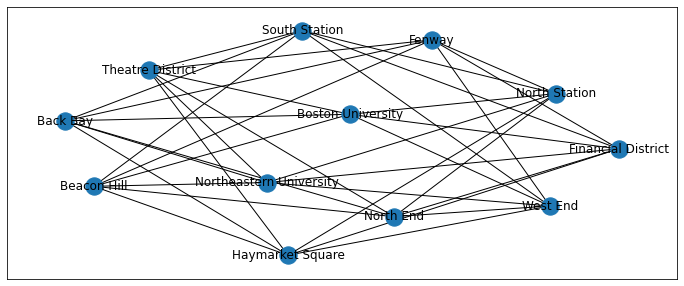

In [46]:
summary=data.groupby(['source','destination']).count()[['id']].reset_index()
summary['id']=summary['id']/5000
summary=pd.DataFrame(data.groupby(['source','destination']).sum()['price']/data.groupby(['source','destination']).count()['id'])
summary=summary.rename(columns={0:"Metric"})
summary=summary.reset_index()

G = nx.from_pandas_edgelist(df=data[['source','destination']], source='source', target='destination')
G.add_nodes_from(nodes_for_adding=summary.source.tolist())
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

fig, ax = plt.subplots(figsize=(12,5))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos)
nx.draw_networkx_edges(G, pos, ax=ax)
_ = nx.draw_networkx_labels(G, pos, labels, ax=ax)

In [47]:
summary.pivot(columns='source',index='destination',values='Metric').fillna(0).style.background_gradient()

source,Back Bay,Beacon Hill,Boston University,Fenway,Financial District,Haymarket Square,North End,North Station,Northeastern University,South Station,Theatre District,West End
destination,,,,,,,,,,,,
Back Bay,0.000000,0.000000,13.992801,13.802155,0.000000,16.860489,19.550935,0.000000,13.698923,19.103822,0.000000,0.000000
Beacon Hill,0.000000,0.000000,17.315535,16.796674,0.000000,13.338559,15.982630,0.000000,16.842433,17.276304,0.000000,0.000000
Boston University,14.039392,16.376737,0.000000,0.000000,25.498434,0.000000,0.000000,18.931558,0.000000,0.000000,20.360662,18.157165
Fenway,13.658752,16.158840,0.000000,0.000000,23.404850,0.000000,0.000000,18.547603,0.000000,0.000000,19.069278,17.932692
Financial District,0.000000,0.000000,24.146085,23.438818,0.000000,12.731618,13.417597,0.000000,22.582094,12.436910,0.000000,0.000000
Haymarket Square,17.987384,13.799137,0.000000,0.000000,13.188209,0.000000,0.000000,12.571791,0.000000,0.000000,15.204973,12.771290
North End,19.473019,15.270942,0.000000,0.000000,13.179635,0.000000,0.000000,13.106641,0.000000,0.000000,15.159646,13.370017
North Station,0.000000,0.000000,20.185338,19.701839,0.000000,12.332545,12.824092,0.000000,19.910939,15.746736,0.000000,0.000000
Northeastern University,13.151040,16.471792,0.000000,0.000000,21.918584,0.000000,0.000000,19.537848,0.000000,0.000000,16.910751,18.964969


(array([ 0.,  0.,  0.,  0.,  0., 12.,  0.,  0.,  0.,  0.]),
 array([5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5]),
 <a list of 10 Patch objects>)

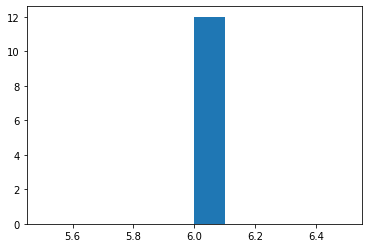

In [48]:
degrees = [G.degree(n) for n in G.nodes()]
plt.hist(degrees)

In [49]:
for i,j in zip(list(G.nodes),[G.degree(n) for n in G.nodes()]):
    print(i,j)

Haymarket Square 6
North Station 6
Back Bay 6
Northeastern University 6
North End 6
West End 6
Beacon Hill 6
South Station 6
Fenway 6
Theatre District 6
Boston University 6
Financial District 6


In [50]:
degree_centrality = nx.degree_centrality(G)
degree_centrality

{'Haymarket Square': 0.5454545454545454,
 'North Station': 0.5454545454545454,
 'Back Bay': 0.5454545454545454,
 'Northeastern University': 0.5454545454545454,
 'North End': 0.5454545454545454,
 'West End': 0.5454545454545454,
 'Beacon Hill': 0.5454545454545454,
 'South Station': 0.5454545454545454,
 'Fenway': 0.5454545454545454,
 'Theatre District': 0.5454545454545454,
 'Boston University': 0.5454545454545454,
 'Financial District': 0.5454545454545454}

In [51]:
degree = G.degree(weight='weight')
max_degree = max(dict(degree).values())
degree_centrality_weighted = [deg/max_degree for deg in dict(degree).values()]
degree_centrality_weighted

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

In [52]:
closeness_centrality = nx.closeness_centrality(G)
for node in sorted(closeness_centrality, key=closeness_centrality.get, reverse=True):
  print(node, closeness_centrality[node])

Haymarket Square 0.6875
North Station 0.6875
Back Bay 0.6875
Northeastern University 0.6875
North End 0.6875
West End 0.6875
Beacon Hill 0.6875
South Station 0.6875
Fenway 0.6875
Theatre District 0.6875
Boston University 0.6875
Financial District 0.6875


In [53]:
nx.closeness_centrality(G, distance='distance')


{'Haymarket Square': 0.6875,
 'North Station': 0.6875,
 'Back Bay': 0.6875,
 'Northeastern University': 0.6875,
 'North End': 0.6875,
 'West End': 0.6875,
 'Beacon Hill': 0.6875,
 'South Station': 0.6875,
 'Fenway': 0.6875,
 'Theatre District': 0.6875,
 'Boston University': 0.6875,
 'Financial District': 0.6875}

In [54]:
betweenness_centrality = nx.betweenness_centrality(G)
betweenness_centrality

{'Haymarket Square': 0.04545454545454544,
 'North Station': 0.04545454545454544,
 'Back Bay': 0.04545454545454544,
 'Northeastern University': 0.04545454545454544,
 'North End': 0.04545454545454544,
 'West End': 0.04545454545454544,
 'Beacon Hill': 0.04545454545454544,
 'South Station': 0.04545454545454544,
 'Fenway': 0.04545454545454544,
 'Theatre District': 0.04545454545454544,
 'Boston University': 0.04545454545454544,
 'Financial District': 0.04545454545454544}

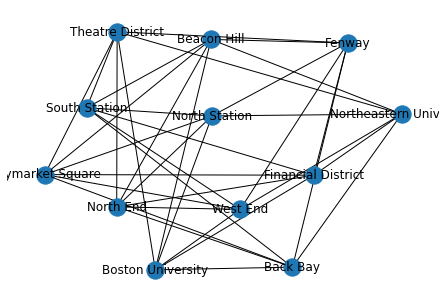

In [55]:
nx.draw(G, with_labels=True)


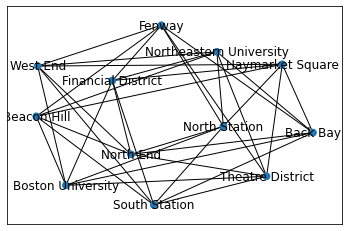

In [56]:
size = [val*1000 for val in nx.betweenness_centrality(G, weight=1).values()]
nx.draw_networkx(G, node_size=size)

In [57]:
nx.betweenness_centrality(G, normalized=True)

{'Haymarket Square': 0.04545454545454544,
 'North Station': 0.04545454545454544,
 'Back Bay': 0.04545454545454544,
 'Northeastern University': 0.04545454545454544,
 'North End': 0.04545454545454544,
 'West End': 0.04545454545454544,
 'Beacon Hill': 0.04545454545454544,
 'South Station': 0.04545454545454544,
 'Fenway': 0.04545454545454544,
 'Theatre District': 0.04545454545454544,
 'Boston University': 0.04545454545454544,
 'Financial District': 0.04545454545454544}

In [58]:
eigenvector_centrality = nx.eigenvector_centrality(G)

In [59]:
eigenvector_centrality

{'Haymarket Square': 0.2886751345948129,
 'North Station': 0.2886751345948129,
 'Back Bay': 0.2886751345948129,
 'Northeastern University': 0.2886751345948129,
 'North End': 0.2886751345948129,
 'West End': 0.2886751345948129,
 'Beacon Hill': 0.2886751345948129,
 'South Station': 0.2886751345948129,
 'Fenway': 0.2886751345948129,
 'Theatre District': 0.2886751345948129,
 'Boston University': 0.2886751345948129,
 'Financial District': 0.2886751345948129}

In [60]:
nx.katz_centrality(G)

{'Haymarket Square': 0.2886751345948129,
 'North Station': 0.2886751345948129,
 'Back Bay': 0.2886751345948129,
 'Northeastern University': 0.2886751345948129,
 'North End': 0.2886751345948129,
 'West End': 0.2886751345948129,
 'Beacon Hill': 0.2886751345948129,
 'South Station': 0.2886751345948129,
 'Fenway': 0.2886751345948129,
 'Theatre District': 0.2886751345948129,
 'Boston University': 0.2886751345948129,
 'Financial District': 0.2886751345948129}

In [61]:
nx.pagerank(G)

{'Haymarket Square': 0.08333333333333334,
 'North Station': 0.08333333333333334,
 'Back Bay': 0.08333333333333334,
 'Northeastern University': 0.08333333333333334,
 'North End': 0.08333333333333334,
 'West End': 0.08333333333333334,
 'Beacon Hill': 0.08333333333333334,
 'South Station': 0.08333333333333334,
 'Fenway': 0.08333333333333334,
 'Theatre District': 0.08333333333333334,
 'Boston University': 0.08333333333333334,
 'Financial District': 0.08333333333333334}

In [62]:
#Undirected and unweighted
nx.hits(G)

/usr/local/lib/python3.8/dist-packages/networkx/algorithms/link_analysis/hits_alg.py:78: FutureWarning:

adjacency_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.



({'Haymarket Square': 0.12460326351622646,
  'North Station': 0.042063403150440194,
  'Back Bay': 0.042063403150440194,
  'Northeastern University': 0.12460326351622646,
  'North End': 0.12460326351622646,
  'West End': 0.042063403150440194,
  'Beacon Hill': 0.042063403150440194,
  'South Station': 0.12460326351622646,
  'Fenway': 0.12460326351622646,
  'Theatre District': 0.042063403150440194,
  'Boston University': 0.12460326351622646,
  'Financial District': 0.042063403150440194},
 {'Haymarket Square': 0.0420634031504402,
  'North Station': 0.12460326351622647,
  'Back Bay': 0.12460326351622647,
  'Northeastern University': 0.0420634031504402,
  'North End': 0.0420634031504402,
  'West End': 0.12460326351622647,
  'Beacon Hill': 0.12460326351622647,
  'South Station': 0.0420634031504402,
  'Fenway': 0.0420634031504402,
  'Theatre District': 0.12460326351622647,
  'Boston University': 0.0420634031504402,
  'Financial District': 0.12460326351622647})

In [63]:
data[['source','destination']]

,source,destination
0,Haymarket Square,North Station
1,Haymarket Square,North Station
2,Haymarket Square,North Station
3,Haymarket Square,North Station
4,Haymarket Square,North Station
...,...,...
693065,West End,North End
693066,West End,North End
693067,West End,North End
693069,West End,North End


Price Related Feature Extraction

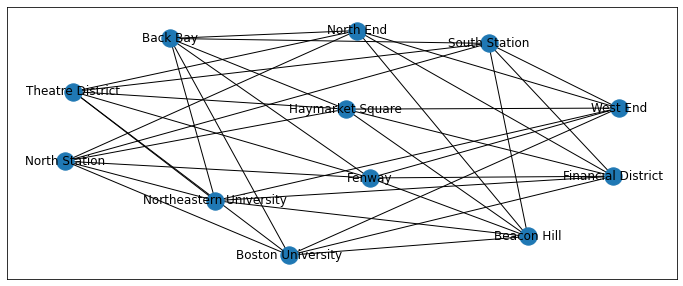

In [64]:
summary=data.groupby(['source','destination']).sum()[['price']].reset_index()
summary['price']=np.log(summary['price'])
G = nx.from_pandas_edgelist(df=summary, source='source', target='destination',edge_key='price')
G.add_nodes_from(nodes_for_adding=summary.source.tolist())
labels = [i for i in dict(G.nodes).keys()]
labels = {i:i for i in dict(G.nodes).keys()}

fig, ax = plt.subplots(figsize=(12,5))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos)
nx.draw_networkx_edges(G, pos, ax=ax)
_ = nx.draw_networkx_labels(G, pos, labels, ax=ax)

(array([ 0.,  0.,  0.,  0.,  0., 12.,  0.,  0.,  0.,  0.]),
 array([5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5]),
 <a list of 10 Patch objects>)

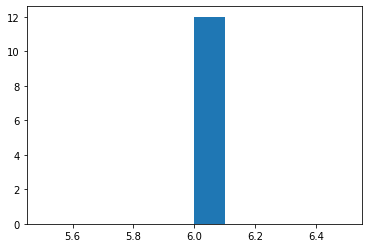

In [65]:
degrees = [G.degree(n) for n in G.nodes()]
plt.hist(degrees)

In [66]:
for i,j in zip(list(G.nodes),[G.degree(n) for n in G.nodes()]):
    print(i,j)

Back Bay 6
Boston University 6
Fenway 6
Haymarket Square 6
North End 6
Northeastern University 6
South Station 6
Beacon Hill 6
Financial District 6
North Station 6
Theatre District 6
West End 6


In [67]:
degree_centrality = nx.degree_centrality(G)
degree_centrality

{'Back Bay': 0.5454545454545454,
 'Boston University': 0.5454545454545454,
 'Fenway': 0.5454545454545454,
 'Haymarket Square': 0.5454545454545454,
 'North End': 0.5454545454545454,
 'Northeastern University': 0.5454545454545454,
 'South Station': 0.5454545454545454,
 'Beacon Hill': 0.5454545454545454,
 'Financial District': 0.5454545454545454,
 'North Station': 0.5454545454545454,
 'Theatre District': 0.5454545454545454,
 'West End': 0.5454545454545454}

In [68]:
degree = G.degree(weight='weight')
max_degree = max(dict(degree).values())
degree_centrality_weighted = [deg/max_degree for deg in dict(degree).values()]
degree_centrality_weighted

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

In [69]:
closeness_centrality = nx.closeness_centrality(G)
for node in sorted(closeness_centrality, key=closeness_centrality.get, reverse=True):
  print(node, closeness_centrality[node])

Back Bay 0.6875
Boston University 0.6875
Fenway 0.6875
Haymarket Square 0.6875
North End 0.6875
Northeastern University 0.6875
South Station 0.6875
Beacon Hill 0.6875
Financial District 0.6875
North Station 0.6875
Theatre District 0.6875
West End 0.6875


In [70]:
nx.closeness_centrality(G, distance='distance')


{'Back Bay': 0.6875,
 'Boston University': 0.6875,
 'Fenway': 0.6875,
 'Haymarket Square': 0.6875,
 'North End': 0.6875,
 'Northeastern University': 0.6875,
 'South Station': 0.6875,
 'Beacon Hill': 0.6875,
 'Financial District': 0.6875,
 'North Station': 0.6875,
 'Theatre District': 0.6875,
 'West End': 0.6875}

In [71]:
betweenness_centrality = nx.betweenness_centrality(G)
betweenness_centrality

{'Back Bay': 0.04545454545454544,
 'Boston University': 0.04545454545454544,
 'Fenway': 0.04545454545454544,
 'Haymarket Square': 0.04545454545454544,
 'North End': 0.04545454545454544,
 'Northeastern University': 0.04545454545454544,
 'South Station': 0.04545454545454544,
 'Beacon Hill': 0.04545454545454544,
 'Financial District': 0.04545454545454544,
 'North Station': 0.04545454545454544,
 'Theatre District': 0.04545454545454544,
 'West End': 0.04545454545454544}

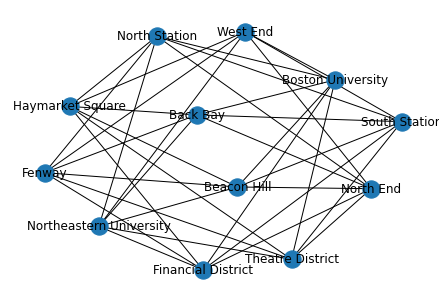

In [72]:
nx.draw(G, with_labels=True)


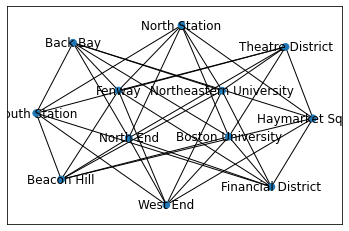

In [73]:
size = [val*1000 for val in nx.betweenness_centrality(G, weight=1).values()]
nx.draw_networkx(G, node_size=size)

In [74]:
nx.betweenness_centrality(G, normalized=True)

{'Back Bay': 0.04545454545454544,
 'Boston University': 0.04545454545454544,
 'Fenway': 0.04545454545454544,
 'Haymarket Square': 0.04545454545454544,
 'North End': 0.04545454545454544,
 'Northeastern University': 0.04545454545454544,
 'South Station': 0.04545454545454544,
 'Beacon Hill': 0.04545454545454544,
 'Financial District': 0.04545454545454544,
 'North Station': 0.04545454545454544,
 'Theatre District': 0.04545454545454544,
 'West End': 0.04545454545454544}

In [75]:
eigenvector_centrality = nx.eigenvector_centrality(G)

In [76]:
eigenvector_centrality

{'Back Bay': 0.2886751345948129,
 'Boston University': 0.2886751345948129,
 'Fenway': 0.2886751345948129,
 'Haymarket Square': 0.2886751345948129,
 'North End': 0.2886751345948129,
 'Northeastern University': 0.2886751345948129,
 'South Station': 0.2886751345948129,
 'Beacon Hill': 0.2886751345948129,
 'Financial District': 0.2886751345948129,
 'North Station': 0.2886751345948129,
 'Theatre District': 0.2886751345948129,
 'West End': 0.2886751345948129}

In [77]:
nx.katz_centrality(G)

{'Back Bay': 0.2886751345948129,
 'Boston University': 0.2886751345948129,
 'Fenway': 0.2886751345948129,
 'Haymarket Square': 0.2886751345948129,
 'North End': 0.2886751345948129,
 'Northeastern University': 0.2886751345948129,
 'South Station': 0.2886751345948129,
 'Beacon Hill': 0.2886751345948129,
 'Financial District': 0.2886751345948129,
 'North Station': 0.2886751345948129,
 'Theatre District': 0.2886751345948129,
 'West End': 0.2886751345948129}

In [78]:
nx.pagerank(G)

{'Back Bay': 0.08333333333333334,
 'Boston University': 0.08333333333333334,
 'Fenway': 0.08333333333333334,
 'Haymarket Square': 0.08333333333333334,
 'North End': 0.08333333333333334,
 'Northeastern University': 0.08333333333333334,
 'South Station': 0.08333333333333334,
 'Beacon Hill': 0.08333333333333334,
 'Financial District': 0.08333333333333334,
 'North Station': 0.08333333333333334,
 'Theatre District': 0.08333333333333334,
 'West End': 0.08333333333333334}

In [186]:
#Undirected and unweighted
effects=pd.DataFrame(nx.hits(G)).T[0]
effects

Back Bay                   0.747870
Boston University         -0.581204
Fenway                    -0.581204
Haymarket Square          -0.581204
North End                 -0.581204
Northeastern University   -0.581204
South Station             -0.581204
Beacon Hill                0.747870
Financial District         0.747870
North Station              0.747870
Theatre District           0.747870
West End                   0.747870
Name: 0, dtype: float64

In [187]:
effects=pd.DataFrame(effects).reset_index().rename(columns={'index':'source',0:'effect_value'})

In [188]:
data_x['source']=data['source']
data_x=data_x.merge(effects,on='source', how='left')

In [189]:
data_x=data_x.drop(columns='source')

In [190]:
analysis=data_x.corr()[['price']]

In [191]:
detailed=list(analysis[(analysis['price']>0.01) | (analysis['price']<-0.01) ].index)

In [192]:
X = data_x.drop('price', axis=1)
y = data_x['price']

In [193]:
X_n = data_x.drop(['effect_value','price'], axis=1)
y_n = data_x['price']

KeyError: ignored

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [ ]:
X_train_n, X_test_n, y_train_n, y_test_n = train_test_split(X_n, y_n, test_size=0.25, random_state=42)

In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
acc = lin_reg.score(X_test, y_test)
print(acc)

In [ ]:
price_predictions = lin_reg.predict(X_train)
lin_mse = mean_squared_error(y_train, price_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X_train_n, y_train_n)
acc = lin_reg.score(X_test_n, y_test_n)
print(acc)

In [ ]:
price_predictions = lin_reg.predict(X_train_n)
lin_mse = mean_squared_error(y_train_n, price_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

In [ ]:
tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X_train, y_train)
acc = tree_reg.score(X_test, y_test)
print(acc)

In [ ]:
price_predictions = tree_reg.predict(X_train)
tree_mse = mean_squared_error(y_train, price_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

In [ ]:

tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X_train_n, y_train_n)
acc = tree_reg.score(X_test_n, y_test_n)
print(acc)

In [ ]:
price_predictions = tree_reg.predict(X_train_n)
tree_mse = mean_squared_error(y_train_n, price_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

In [ ]:
scores = cross_val_score(tree_reg, X_train, y_train,
                        scoring='neg_mean_squared_error', cv=10)
tree_rmse_scores = np.sqrt(-scores)

In [ ]:
def display_scores(scores):
    print('Score: ', scores)
    print('Mean: ', scores.mean())
    print('Standard Deviation: ', scores.std())

In [ ]:
display_scores(tree_rmse_scores)

In [ ]:
scores = cross_val_score(tree_reg, X_train_n, y_train_n,
                        scoring='neg_mean_squared_error', cv=10)
tree_rmse_scores = np.sqrt(-scores)

In [ ]:
display_scores(tree_rmse_scores)

In [ ]:
detailed=list(analysis[(analysis['price']>0.2) | (analysis['price']<-0.2) ].index)
detailed

In [ ]:
X = data_x[detailed].drop('price', axis=1)
y = data_x['price']

In [ ]:
detailed.append('effect_value')

In [ ]:
X_n = data_x[detailed].drop(['effect_value','price'], axis=1)
y_n = data_x['price']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [194]:
X_train_n, X_test_n, y_train_n, y_test_n = train_test_split(X_n, y_n, test_size=0.25, random_state=42)

In [195]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
acc = lin_reg.score(X_test, y_test)
print(acc)

0.9080164451757626


In [196]:
price_predictions = lin_reg.predict(X_train)
lin_mse = mean_squared_error(y_train, price_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

2.8264470475630965

In [197]:
lin_reg = LinearRegression()
lin_reg.fit(X_train_n, y_train_n)
acc = lin_reg.score(X_test_n, y_test_n)
print(acc)

0.9080164451757626


In [198]:
price_predictions = lin_reg.predict(X_train_n)
lin_mse = mean_squared_error(y_train_n, price_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

2.8264470475630965

In [199]:
tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X_train, y_train)
acc = tree_reg.score(X_test, y_test)
print(acc)

0.946006389126331


In [200]:
price_predictions = tree_reg.predict(X_train)
tree_mse = mean_squared_error(y_train, price_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

2.1062724681829796

In [201]:

tree_reg = DecisionTreeRegressor(random_state=42)
tree_reg.fit(X_train_n, y_train_n)
acc = tree_reg.score(X_test_n, y_test_n)
print(acc)

0.946006389126331


In [202]:
price_predictions = tree_reg.predict(X_train_n)
tree_mse = mean_squared_error(y_train_n, price_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

2.1062724681829796

In [203]:
scores = cross_val_score(tree_reg, X_train, y_train,
                        scoring='neg_mean_squared_error', cv=10)
tree_rmse_scores = np.sqrt(-scores)

In [204]:
def display_scores(scores):
    print('Score: ', scores)
    print('Mean: ', scores.mean())
    print('Standard Deviation: ', scores.std())

In [205]:
display_scores(tree_rmse_scores)

Score:  [2.15714698 2.13797211 2.13880963 2.15294371 2.1437641  2.18735156
 2.14755807 2.18557201 2.21358366 2.16378233]
Mean:  2.1628484165263155
Standard Deviation:  0.02370023650776273


In [206]:
scores = cross_val_score(tree_reg, X_train_n, y_train_n,
                        scoring='neg_mean_squared_error', cv=10)
tree_rmse_scores = np.sqrt(-scores)

In [207]:
display_scores(tree_rmse_scores)

Score:  [2.15714698 2.13797211 2.13880963 2.15294371 2.1437641  2.18735156
 2.14755807 2.18557201 2.21358366 2.16378233]
Mean:  2.1628484165263155
Standard Deviation:  0.02370023650776273
